<a href="https://colab.research.google.com/github/JNK234/100-days-of-deep-learning/blob/main/Day-13/Object_Detection_using_IceVision_and_Fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11

# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

--2022-03-07 08:52:04--  https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2691 (2.6K) [text/plain]
Saving to: ‘icevision_install.sh’

icevision_install.s 100%[===================>]   2.63K  --.-KB/s    in 0s      

2022-03-07 08:52:04 (48.1 MB/s) - ‘icevision_install.sh’ saved [2691/2691]

Installing icevision + dependencices for cuda11
- Installing torch and its dependencies
Looking in links: https://download.pytorch.org/whl/torch_stable.html
- Installing mmcv
     |████████████████████████████████| 51.3 MB 274 kB/s 
     |████████████████████████████████| 190 kB 12.5 MB/s 
- Installing mmdet
     |████████████████████████████████| 1.2 MB 12.4 MB/s 
- Installing icevision from Py

{'restart': True, 'status': 'ok'}

## Imports

In [131]:
from icevision.all import *

In [132]:
# Download the dataset
url = "https://cvbp-secondary.z19.web.core.windows.net/datasets/object_detection/odFridgeObjects.zip"
dest_dir = "fridge"
data_dir = icedata.load_data(url, dest_dir)

In [133]:
(data_dir/'odFridgeObjects').ls()

(#3) [Path('/root/.icevision/data/fridge/odFridgeObjects/.DS_Store'),Path('/root/.icevision/data/fridge/odFridgeObjects/images'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations')]

In [134]:
(data_dir/'odFridgeObjects/images').ls()

(#128) [Path('/root/.icevision/data/fridge/odFridgeObjects/images/81.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/19.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/39.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/122.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/128.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/32.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/27.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/116.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/15.jpg'),Path('/root/.icevision/data/fridge/odFridgeObjects/images/48.jpg')...]

In [135]:
(data_dir/'odFridgeObjects/annotations').ls()

(#128) [Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/75.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/114.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/13.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/68.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/121.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/90.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/22.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/72.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/60.xml'),Path('/root/.icevision/data/fridge/odFridgeObjects/annotations/107.xml')...]

## Parse data

In [136]:
# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir/'odFridgeObjects/annotations/', 
                               images_dir= data_dir/'odFridgeObjects/images')

In [137]:
train_records, valid_records = parser.parse()
print(parser.class_map)

  0%|          | 0/128 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/128 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>


## Data Augmentations

In [138]:
# Transforms
# Size to be resized to 384 because the image size must be divisible by 128 for EfficientDet
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), 
                             tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [139]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

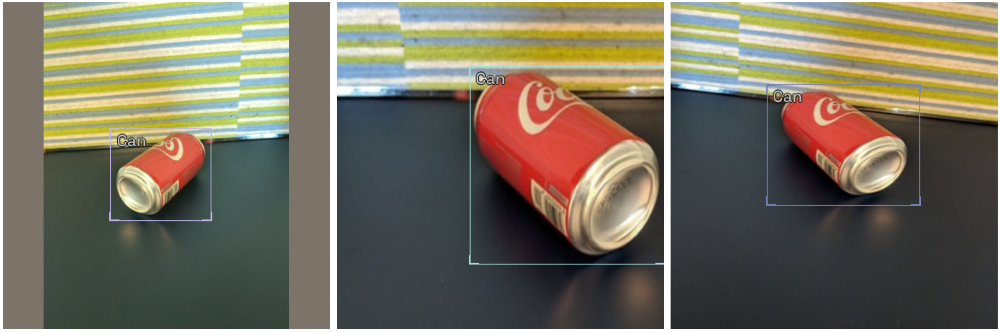

In [140]:
# Display a single image multiple times with different transformations
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

## Select a library, model and backbone 

### Creating a model

In [141]:
from icevision import models

In [142]:
# Just define the selection to chenage the model and backbone

selection = 0

extra_args = {}

if selection==0:
    model_type = models.mmdet.vfnet
    backbone = model_type.backbones.resnet50_fpn_mstrain_2x

elif selection==1:
    model_type = models.mmdet.retinanet
    backbone = model_type.backbones.resnet50_fpn_1x

elif selection==2:
    model_type = models.mmdet.faster_rcnn
    backbone = model_type.backbones.resnet101_fpn_2x

elif selection==3:
    model_type = models.mmdet.ssd
    backbone = model_type.backbones.ssd300

elif selection==4:
    model_type = models.mmdet.yolox
    backbone = model_type.backbones.yolox_s_8x8

elif selection==5:
    model_type = models.mmdet.yolof
    backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

elif selection==6:
    model_type = models.mmdet.detr
    backbone = model_type.backbones.r50_8x2_150e_coco

elif selection==7:
    model_type = models.mmdet.deformable_detr
    backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

elif selection==8:
    model_type = models.mmdet.fsaf
    backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

elif selection==9:
    model_type = models.mmdet.sabl
    backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

elif selection==10:
    model_type = models.mmdet.centripetalnet
    backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection==11:
    # Retinanet is also implemented in torchvision library
    model_type = models.torchvision.retinanet
    backbone = model_type.backbones.resnet50_fpn

elif selection==12:
    model_type = models.ross.efficientdet
    backbone = model_type.backbones.tf_lite0
    # Efficientdet requires an image_size parameter
    extra_args['image_size'] = image_size

elif selection==13:
    model_type = models.ultralytics.yolov5
    backbone = model_type.backbones.small
    # Yolo model requires image_size parameter
    extra_args['image_size'] = image_size


In [143]:
model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.vfnet' from '/usr/local/lib/python3.7/dist-packages/icevision/models/mmdet/models/vfnet/__init__.py'>,
 {})

In [144]:
backbone.__dict__

{'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs/vfnet/vfnet_r50_fpn_mstrain_2x_coco.py'),
 'model_name': 'vfnet',
 'pretrained': False,
 'weights_url': 'https://openmmlab.oss-cn-hangzhou.aliyuncs.com/mmdetection/v2.0/vfnet/vfnet_r50_fpn_mstrain_2x_coco/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth'}

In [145]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2022-03-07 11:45:45,272 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-03-07 11:45:45,273 - mmcv - INFO - load model from: torchvision://resnet50
2022-03-07 11:45:45,278 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2022-03-07 11:45:45,387 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-03-07 11:45:45,429 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-03-07 11:45:45,466 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'No

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([4, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([4]).


## Data Loaders

In [146]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


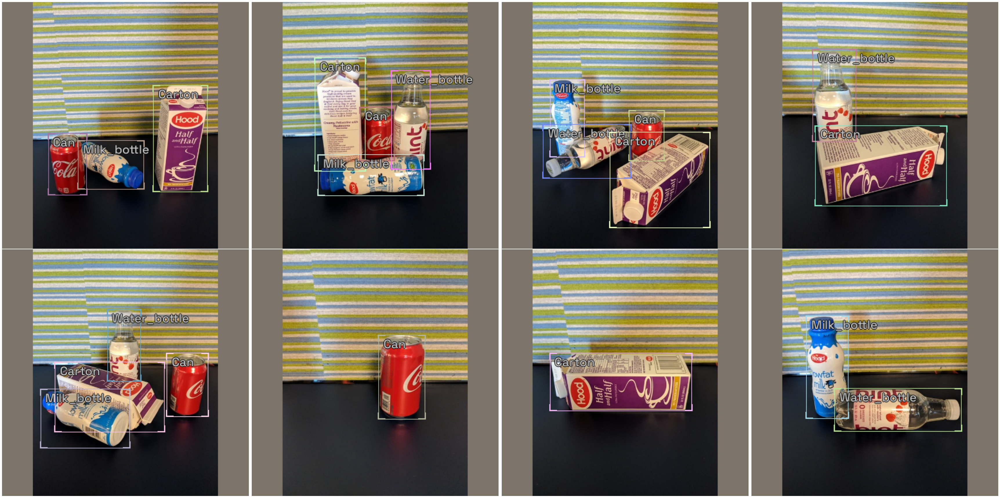

In [147]:
model_type.show_batch(first(valid_dl), ncols=4)

## Metrics

In [148]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Training using fastai

In [149]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=0.0005754399462603033)

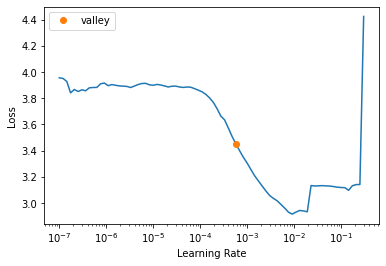

In [32]:
learn.lr_find()

In [150]:
learn.fine_tune(20, 5e-3, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,3.163088,2.964179,0.187822,00:18
1,2.858384,2.063475,0.263355,00:17


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.740298,1.520145,0.477774,00:19
1,1.565928,1.309734,0.573577,00:19
2,1.447128,1.179772,0.739215,00:19
3,1.370882,1.157700,0.789017,00:19
4,1.366692,1.225337,0.701323,00:19
5,1.390423,1.497445,0.680190,00:19
6,1.338159,1.077710,0.782866,00:19
7,1.305642,1.249406,0.750197,00:19
8,1.254147,0.994354,0.803712,00:19
9,1.192958,0.897691,0.845753,00:19


## Model Inference

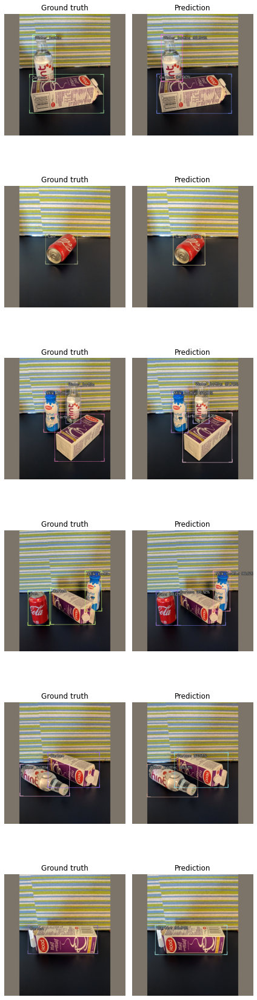

In [151]:
model_type.show_results(model, valid_ds, detection_threshold=0.5)

## Predictions - Inference Dataset

In [152]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/7 [00:00<?, ?it/s]

In [153]:
preds[0].ground_truth

BaseRecord

common: 
	- Record ID: 54
	- Image size ImgSize(width=384, height=384)
	- Filepath: /root/.icevision/data/fridge/odFridgeObjects/images/54.jpg
	- Img: 384x384x3 <np.ndarray> Image
detection: 
	- BBoxes: [<BBox (xmin:72.24048096192385, ymin:204.10810810810813, xmax:131.68737474949899, ymax:300.97297297297297)>, <BBox (xmin:118.4128256513026, ymin:215.63963963963965, xmax:220.56913827655313, ymax:291.7477477477477)>, <BBox (xmin:235.5751503006012, ymin:129.15315315315317, xmax:319.26252505010024, ymax:295.7837837837838)>]
	- Class Map: <ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>
	- Labels: [3, 2, 1]

In [154]:
preds[0].pred

BaseRecord

common: 
	- Record ID: 54
	- Img: 384x384x3 <np.ndarray> Image
	- Image size ImgSize(width=384, height=384)
detection: 
	- BBoxes: [<BBox (xmin:234.65921020507812, ymin:129.27481079101562, xmax:319.85772705078125, ymax:296.4366455078125)>, <BBox (xmin:120.80050659179688, ymin:212.9711151123047, xmax:221.98309326171875, ymax:291.2136535644531)>, <BBox (xmin:72.86036682128906, ymin:203.60745239257812, xmax:132.25540161132812, ymax:303.2384948730469)>]
	- Class Map: <ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>
	- Labels: [1, 2, 3]
	- Scores: [    0.99676     0.89948     0.99506]

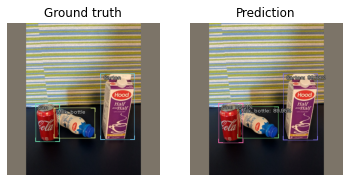

In [157]:
show_pred(preds[0])

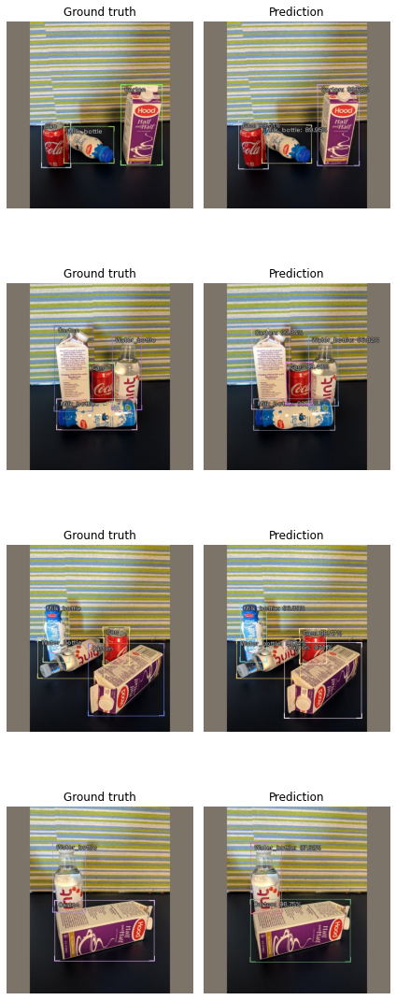

In [158]:
show_preds(preds[:4])

## Saving the model checkpoint

In [159]:
from icevision.models.checkpoint import save_icevision_checkpoint

In [160]:
checkpoint_path = 'fridge-vfnet-resnet50_fpn_mstrain_2x.pth'

save_icevision_checkpoint(model, 
                          model_name='mmdet.vfnet',
                          backbone_name='resnet50_fpn_mstrain_2x',
                          classes = parser.class_map.get_classes(),
                          img_size=image_size,
                          filename=checkpoint_path,
                          meta={'icevision_version': '0.9.1'})

## Loading the checkpoint and create the corresponding model

In [161]:
import os 
os.listdir()

['.config',
 'icevision_install.sh',
 'fridge-vfnet-resnet50_fpn_mstrain_2x.pth',
 'models',
 'checkpoints',
 'sample_data']

In [163]:
new_checkpoint_path = 'fridge-vfnet-resnet50_fpn_mstrain_2x.pth'

In [164]:
from icevision.models import *

checkpoint_model = model_from_checkpoint(filename=new_checkpoint_path,)

load checkpoint from local path: fridge-vfnet-resnet50_fpn_mstrain_2x.pth


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2022-03-07 11:54:14,672 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-03-07 11:54:14,674 - mmcv - INFO - load model from: torchvision://resnet50
2022-03-07 11:54:14,678 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2022-03-07 11:54:14,794 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-03-07 11:54:14,832 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-03-07 11:54:14,868 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'No

In [165]:
# Just logging the info
model_type = checkpoint_model["model_type"]
backbone = checkpoint_model["backbone"]
class_map = checkpoint_model["class_map"]
img_size = checkpoint_model["img_size"]
model_type, backbone, class_map, img_size

(<module 'icevision.models.mmdet.models.vfnet' from '/usr/local/lib/python3.7/dist-packages/icevision/models/mmdet/models/vfnet/__init__.py'>,
 <ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>,
 384)

In [166]:
# Get the model object. Get model from object returns a dictionary
model = checkpoint_model['model']

# Check device
device = next(model.parameters()).to("cuda").device
device

device(type='cuda', index=0)

In [167]:
# Transforms 
image_size = checkpoint_model['img_size']
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
class_map = checkpoint_model['class_map']

In [168]:
path_to_image_files = (data_dir/'odFridgeObjects/images')
image_files = get_image_files(path_to_image_files)

In [169]:
# Create dataset from images 
images_array = [PIL.Image.open(fpath) for fpath in image_files[:40]]
infer_ds = Dataset.from_images(images_array, valid_tfms, class_map=class_map)

In [170]:
# Create inference dataloader and perform predictions
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True, detection_threshold=0.5)

  0%|          | 0/10 [00:00<?, ?it/s]

In [114]:
preds[0].ground_truth

BaseRecord

common: 
	- Img: 640x640x3 <np.ndarray> Image
	- Record ID: 0
	- Image size ImgSize(width=640, height=640)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'person': 1, 'bicycle': 2, 'car': 3, 'motorcycle': 4, 'airplane': 5, 'bus': 6, 'train': 7, 'truck': 8, 'boat': 9, 'traffic light': 10, 'fire hydrant': 11, 'stop sign': 12, 'parking meter': 13, 'bench': 14, 'bird': 15, 'cat': 16, 'dog': 17, 'horse': 18, 'sheep': 19, 'cow': 20, 'elephant': 21, 'bear': 22, 'zebra': 23, 'giraffe': 24, 'backpack': 25, 'umbrella': 26, 'handbag': 27, 'tie': 28, 'suitcase': 29, 'frisbee': 30, 'skis': 31, 'snowboard': 32, 'sports ball': 33, 'kite': 34, 'baseball bat': 35, 'baseball glove': 36, 'skateboard': 37, 'surfboard': 38, 'tennis racket': 39, 'bottle': 40, 'wine glass': 41, 'cup': 42, 'fork': 43, 'knife': 44, 'spoon': 45, 'bowl': 46, 'banana': 47, 'apple': 48, 'sandwich': 49, 'orange': 50, 'broccoli': 51, 'carrot': 52, 'hot dog': 53, 'pizza': 54, 'donut': 55, 'cake': 56, 'chair': 57, 

In [172]:
preds[0].pred

BaseRecord

common: 
	- Image size ImgSize(width=384, height=384)
	- Record ID: 0
	- Img: 384x384x3 <np.ndarray> Image
detection: 
	- Class Map: <ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>
	- Labels: [1]
	- BBoxes: [<BBox (xmin:103.09400939941406, ymin:100.37319946289062, xmax:184.80055236816406, ymax:302.7555847167969)>]
	- Scores: [    0.99404]

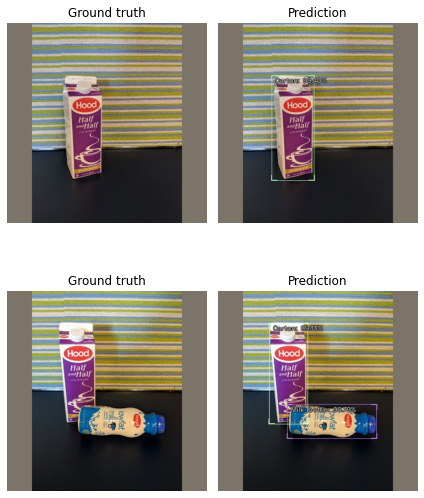

In [173]:
show_preds(preds=preds[:2])

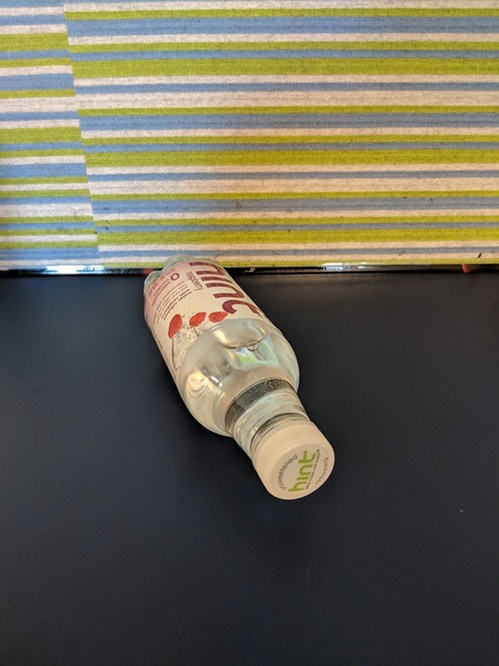

In [174]:
img = PIL.Image.open(image_files[4])
img

In [176]:
predict_dict = model_type.end2end_detect(img, valid_tfms, model, class_map=class_map, detection_threshold=0.5)
predict_dict

{'detection': {'bboxes': [<BBox (xmin:138, ymin:253, xmax:337, ymax:508)>],
  'label_ids': [4],
  'labels': ['water_bottle'],
  'scores': array([    0.99831], dtype=float32)},
 'height': 499,
 'img': <PIL.Image.Image image mode=RGB size=499x666 at 0x7F4BCFF56190>,
 'width': 666}

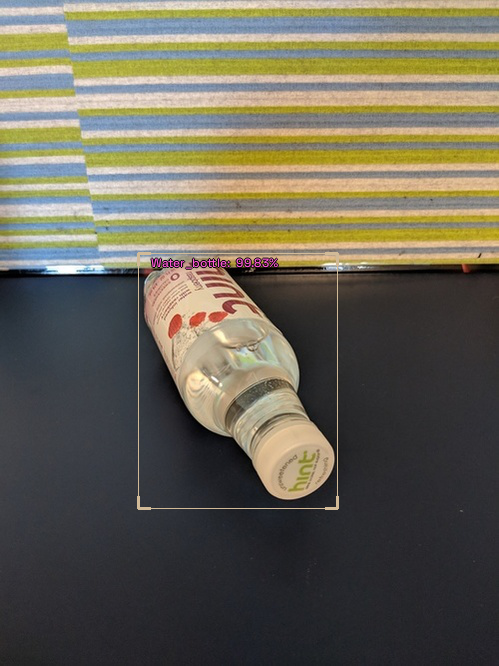

In [177]:
predict_dict['img']